# I’m Something of a Painter Myself - Image Generation
## Introduction
Our goal in this project is to create a Generative Adversarial Network (GAN), which consists of a Generator model and a Deiscriminator model, that can somewhat accurately generate images in the Monet art style. Our GAN must generate between 7,000 and 10,000 Money-style images and will be evaluated on MiFID. Our dataset should consist 300 monet jpg's, 7038 photo jpg's, 5 monet tfrec files, and 30 photo tfrec files. For our solution we will be focusing primarily on the monet jpg files as our goal is to generate entirely new photos in the monet art style. With this in mind we should note that our monet jpgs should be sized 256 by 256, RGB, and in the JPEG format (effectively of a shape (256, 256, 3)) but we will proceed with data analysis to confirm this.

Github: https://github.com/KingSherriff/Im-Something-of-a-Painter

Sources: 
- https://arxiv.org/pdf/1611.07004v1
- https://github.com/soumith/ganhacks
- https://medium.com/@marcodelpra/generative-adversarial-networks-dba10e1b4424
- https://www.tensorflow.org/tutorials/generative/dcgan
- https://arxiv.org/pdf/1511.06434
- https://keras.io/examples/generative/conditional_gan/

## Import Packages

In [10]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import zipfile
from PIL import Image
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, ReLU, Flatten, Dense, Dropout, BatchNormalization, Reshape

## Import Data

In [11]:
img_dir = "/kaggle/input/gan-getting-started/monet_jpg"
real_monet = tf.keras.utils.image_dataset_from_directory(img_dir, label_mode=None, image_size = (256, 256), batch_size = 32)
real_monet = real_monet.map(lambda x: (x / 127.5) - 1)

Found 300 files.


## EDA
As we will be focused primarily on image generation in the monet style we are making use of only the monet jpg data. Analysing this shows us some much expected and some interesting results. As expected we have 300 images all of 256 by 256 size on an RGB scale. Below we will display some sample images to get an idea for what a 'monet' image really is and we can see how it uses a distinct painting like art style of primarily scenery and objects such as flowers. Taking a deeper look at the image data we can see that our transformation of the color values from the 0 to 255 range down to the -1 to 1 range has taken affect and that there is often a lot of overlap in pixel intensity per color per image. While there are of course exceptions where some images contain significantly more of one or two colors over another we can see that this is usually not the case by observing the color intensity of all our monet images. As shown most images result in an accumulated overlap in pixel intensity with the exception of some images containing absolutely no blue and some but fewer containing no red.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

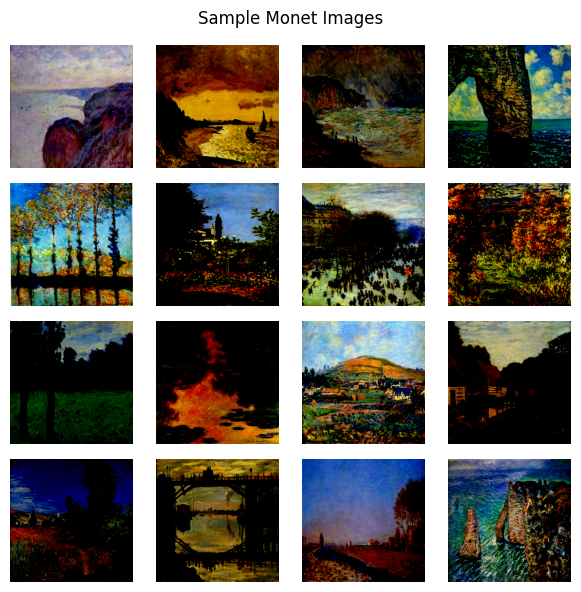

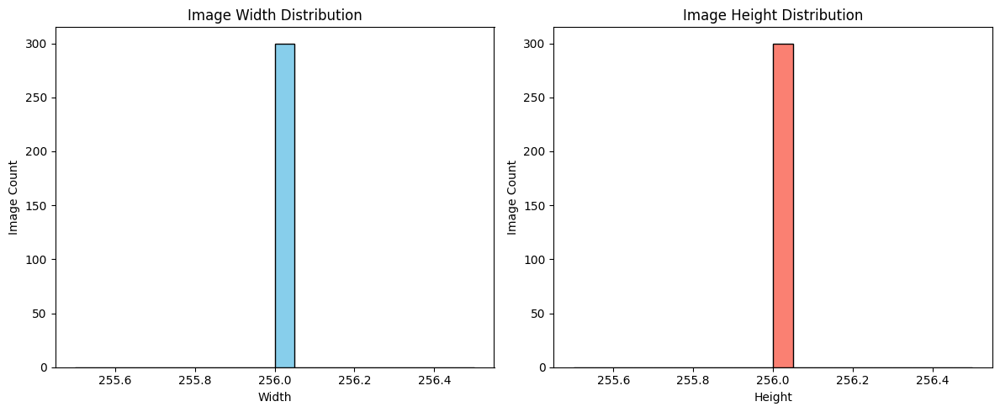

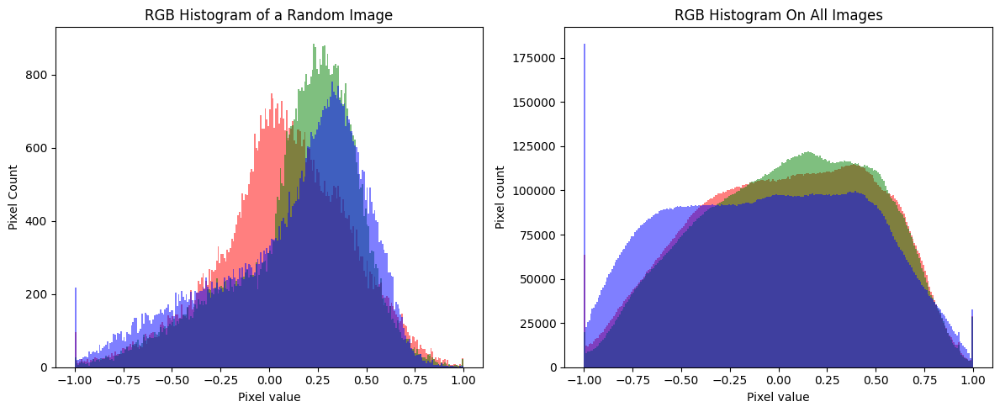

In [12]:
def display_sample_images():
    batch = next(iter(real_monet))
    display_images = batch[:16]
    
    plt.figure(figsize=(6,6))
    plt.suptitle("Sample Monet Images")
    for i in range(16):
        plt.subplot(4, 4, i+1)
        plt.imshow((display_images[i]))
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

def analyze_image_size():
    sizes = [Image.open(os.path.join(img_dir, file)).size for file in os.listdir(img_dir)]
    widths, heights = zip(*sizes)

    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.hist(widths, bins=20, color='skyblue', edgecolor='black')
    plt.title("Image Width Distribution")
    plt.xlabel("Width")
    plt.ylabel("Image Count")
    
    plt.subplot(1, 2, 2)
    plt.hist(heights, bins=20, color='salmon', edgecolor='black')
    plt.title("Image Height Distribution")
    plt.xlabel("Height")
    plt.ylabel("Image Count")

    plt.tight_layout()
    plt.show

def analyze_image_colors():
    batch = next(iter(real_monet))
    display_images = batch[:16]
    colors = ['red', 'green', 'blue']
    
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    
    for i, color in enumerate(colors):
        plt.hist(display_images[0].numpy()[:, :, i].ravel(), bins=256, alpha=0.5, color=color)

    plt.title('RGB Histogram of a Random Image')
    plt.xlabel('Pixel value')
    plt.ylabel('Pixel Count')

    plt.subplot(1, 2, 2)
    
    pixels_values = [[], [], []]

    for i in range(len(pixels_values)):
        for batch in real_monet:
            batch_np = batch.numpy()
            pixels_values[i].append(batch_np[:, :, :, i].ravel())
    pixels_values = [np.concatenate(color) for color in pixels_values]

    plt.hist(pixels_values[0], bins=256, color='red', alpha=0.5, label='Red')
    plt.hist(pixels_values[1], bins=256, color='green', alpha=0.5, label='Green')
    plt.hist(pixels_values[2], bins=256, color='blue', alpha=0.5, label='Blue')
    plt.title("RGB Histogram On All Images")
    plt.xlabel("Pixel value")
    plt.ylabel("Pixel count")

    plt.tight_layout()
    plt.show

display_sample_images()
analyze_image_size()
analyze_image_colors()

## Model Architecture
After much research I am going with a DCGAN due to it's stated stability when compared to other models and it's usefulness in images of around the same quality of 256 by 256 pictuures. A number of architectures were considered for this project before I finally settled on the DCGAN. The architecture I was most excited for was the Progressive GAN. This architecture allows us to start off at a much lower resolution such as 4 by 4 and progressively upscale so that our generator can produce high quality images. However it quickly became apperant that this method would be far too computationally expensive and may not provide significant benefit for our images that are only 256 by 256. Models like mDCGAN were attractive as they appeared to be targeting this specific problem, however the paper shows that there is still much work to be done regarding their overfitting and instability: https://arxiv.org/pdf/2403.18397. Because of this it appeared clear that I was best off sticking with a simple but powerful GAN that would be effective, stable, and relatively quick which was the DCGAN. While the quality of the final result may not be perfect, it appears most worth the cost and most stable option available.

### DCGAN/LSGAN
DCGAN's are a well established and popular convolution GAN architecture that are known for their relative stability and efficient training when compared with more specialized architectures especially for moderate resolutions like ours. It avoids using fully connected layers and max pooling to instead use convolutional and transposed-convolutional layers alongside batch normalization to stabilize its learning ability by downsampling and upsampling. Advancements in mode architecture have shown even further efficiencies can be gained by using LeakyReLU in the discriminator. While the model architecture itself will remain exactly the same, it must be acknowledged that we will also be testing the Least Squared Loss method and this is at times considered it's own architecture. For this project, because we will not be adjusting the model approach other than the loss and this approach is largely associated with DCGAN I will largely refer to the architecture as DCGAN and one of the loss functions as Least Squared Loss.

### Minimax Loss
I will be making use of the original loss function proposed in the GAN paper in order to get a baseline and an understanding of the model especially in comparison to the two loss functions we will test later on. This loss function has the discriminator attempt to maximize loss while the generator attempts to minimize it and is the original foundation of GAN trainig.

### Modified Minimax Loss
This is a loss function generally known to outperform Minimax loss by resolving one of the primary issues that existed in the old function. The discriminator has a very easy time identifying fake images early on in original formula which can result in the generator not learning as it's attempts at improvement are overwhelmed by the discriminator's ability to identify fake images. To resolve this issue the generator attemptes to maximize the log of the loss rather than minimize the loss itself.

### Least Square Loss
I'll be using Least Square Loss as well and comparing the results with the Modified Minimax Loss. The idea behind the Least Squared Loss appears to be that often the discrinimator is quite good at identifying fake images, but not very helpful in training the generator. This is quite similar to the issue that Modified Minimax Loss resolved. The difference is in how Least Squared Loss calculates more linear gradients than the Modified Minimax method which can have very small or very large gradients further resulting in very small or very large swings. The idea would be that Least Squared Loss should result in a smoother gradient and thus more refined training process.

In [13]:
class GANDiscriminator:
    def __init__(self, input_shape=(256, 256, 3)):
        self.input_shape = input_shape
        self.model = self.build_model()

    def build_model(self):
        discriminator = Sequential()
        discriminator.add(keras.Input(shape = self.input_shape))
        discriminator.add(Conv2D(64, 4, 2, 'same'))
        discriminator.add(LeakyReLU(0.2))
        discriminator.add(Conv2D(128, 4, 2, 'same'))
        discriminator.add(LeakyReLU(0.2))
        discriminator.add(Conv2D(256, 4, 2, 'same'))
        discriminator.add(LeakyReLU(0.2))
        discriminator.add(Conv2D(512, 4, 2, 'same'))
        discriminator.add(LeakyReLU(0.2))
        discriminator.add(Flatten())
        discriminator.add(Dropout(0.2))
        discriminator.add(Dense(1, activation = 'sigmoid'))
        return discriminator

In [14]:
class GANDiscriminatorLS:
    def __init__(self, input_shape=(256, 256, 3)):
        self.input_shape = input_shape
        self.model = self.build_model()

    def build_model(self):
        discriminator = Sequential()
        discriminator.add(keras.Input(shape = self.input_shape))
        discriminator.add(Conv2D(64, 4, 2, 'same'))
        discriminator.add(LeakyReLU(0.2))
        discriminator.add(Conv2D(128, 4, 2, 'same'))
        discriminator.add(LeakyReLU(0.2))
        discriminator.add(Conv2D(256, 4, 2, 'same'))
        discriminator.add(LeakyReLU(0.2))
        discriminator.add(Conv2D(512, 4, 2, 'same'))
        discriminator.add(LeakyReLU(0.2))
        discriminator.add(Flatten())
        discriminator.add(Dropout(0.2))
        discriminator.add(Dense(1))
        return discriminator

In [15]:
class GANGenerator:
    def __init__(self, input_shape=(128,)):
        self.input_shape = input_shape
        self.model = self.build_model()

    def build_model(self):
        generator = Sequential()
        generator.add(Dense(4 * 4 * 1024))
        generator.add(Reshape((4, 4, 1024)))
        generator.add(BatchNormalization())
        generator.add(ReLU())
        
        generator.add(Conv2DTranspose(512, 4, 2, 'same'))
        generator.add(BatchNormalization())
        generator.add(ReLU())
        
        generator.add(Conv2DTranspose(256, 4, 2, 'same'))
        generator.add(BatchNormalization())
        generator.add(ReLU())
        
        generator.add(Conv2DTranspose(128, 4, 2, 'same'))
        generator.add(BatchNormalization())
        generator.add(ReLU())

        generator.add(Conv2DTranspose(64, 4, 2, 'same'))
        generator.add(BatchNormalization())
        generator.add(ReLU())

        generator.add(Conv2DTranspose(32, 4, 2, 'same'))
        generator.add(BatchNormalization())
        generator.add(ReLU())
        
        generator.add(Conv2DTranspose(3, kernel_size=4, strides=2, padding='same', activation='tanh'))
        return generator

In [16]:
class Minimax:
    def d_loss(self, real, fake):
        return -(tf.reduce_mean(tf.math.log(real + 1e-8)) + tf.reduce_mean(tf.math.log(1 - fake + 1e-8)))
    
    def g_loss(self, fake):
        return tf.reduce_mean(tf.math.log(1 - fake + 1e-8))

class ModifiedMinimax:
    def d_loss(self, real, fake):
        return -(tf.reduce_mean(tf.math.log(real + 1e-8)) + tf.reduce_mean(tf.math.log(1 - fake + 1e-8)))
    
    def g_loss(self, fake):
        return -tf.reduce_mean(tf.math.log(fake + 1e-8))

class LeastSquare:
    def d_loss(self, real, fake):
        return 0.5 * (tf.reduce_mean((real - 1 + 1e-8) ** 2)) + 0.5 * (tf.reduce_mean(fake ** 2))
    
    def g_loss(self, fake):
        return tf.reduce_mean((fake - 1 + 1e-8) ** 2)

In [17]:
class GAN:
    def __init__(self, generator, discriminator, loss):
        self.generator = generator.model
        self.discriminator = discriminator.model
        self.loss = loss
        self.latent_dim = generator.input_shape[0]
        self.g_optimizer = Adam(0.0002, 0.5)
        self.d_optimizer = Adam(0.0002, 0.5)
        self.d_losses = []
        self.g_losses = []

    def generate_and_save_images(self, epoch):
        noise = tf.random.normal([16, self.latent_dim])
        predictions = self.generator(noise, training=False)
        fig = plt.figure(figsize=(12, 12))
        
        for i in range(predictions.shape[0]):
            plt.subplot(4, 4, i+1)
            plt.imshow(tf.clip_by_value((predictions[i] + 1) / 2, 0, 255))
            plt.axis('off')
        plt.show()

    def train(self, dataset, epochs=20):
        for epoch in range(epochs):
            for real_images in dataset:
                batch_size = tf.shape(real_images)[0]
                noise = tf.random.normal([batch_size, self.latent_dim])
                
                with tf.GradientTape() as d_tape:
                    fake_images = self.generator(noise, training=True)
                    real_out = self.discriminator(real_images, training=True)
                    fake_out = self.discriminator(fake_images, training=True)
                    d_loss = self.loss.d_loss(real_out, fake_out)
                    
                self.d_losses.append(d_loss)
                d_gradiants = d_tape.gradient(d_loss, self.discriminator.trainable_variables)
                self.d_optimizer.apply_gradients(zip(d_gradiants, self.discriminator.trainable_variables))
                
                with tf.GradientTape() as g_tape:
                    fake_images = self.generator(noise, training=True)
                    fake_out = self.discriminator(fake_images, training=True)
                    g_loss = self.loss.g_loss(fake_out)
                
                self.g_losses.append(g_loss)
                g_gradiants = g_tape.gradient(g_loss, self.generator.trainable_variables)
                self.g_optimizer.apply_gradients(zip(g_gradiants, self.generator.trainable_variables))
            
            print(f"Epoch {epoch}: D={d_loss}, G={g_loss}")
        self.generate_and_save_images(epoch)
        return self

Epoch 0: D=0.00033552097738720477, G=-0.00022505894594360143
Epoch 1: D=0.00014650524826720357, G=-0.00011404234828660265
Epoch 2: D=0.00011237104627070948, G=-8.258675370598212e-05
Epoch 3: D=8.461863035336137e-05, G=-6.90403176122345e-05
Epoch 4: D=8.848310972098261e-05, G=-5.7629997172625735e-05
Epoch 5: D=4.8877631343202665e-05, G=-4.597174120135605e-05
Epoch 6: D=4.4848657125839964e-05, G=-3.806342647294514e-05
Epoch 7: D=6.958244921406731e-05, G=-5.1073850045213476e-05
Epoch 8: D=3.753719283849932e-05, G=-3.298215233371593e-05
Epoch 9: D=3.3230211556656286e-05, G=-2.6002991944551468e-05
Epoch 10: D=2.533238148316741e-05, G=-2.3767723178025335e-05
Epoch 11: D=2.4607272280263714e-05, G=-2.2371988961822353e-05
Epoch 12: D=1.9019065803149715e-05, G=-1.683850678091403e-05
Epoch 13: D=0.000164387485710904, G=-2.9406219255179167e-05
Epoch 14: D=1.4727425877936184e-05, G=-1.3177691471355502e-05
Epoch 15: D=1.7628410205361433e-05, G=-1.7290658433921635e-05
Epoch 16: D=4.5220924221212044e-

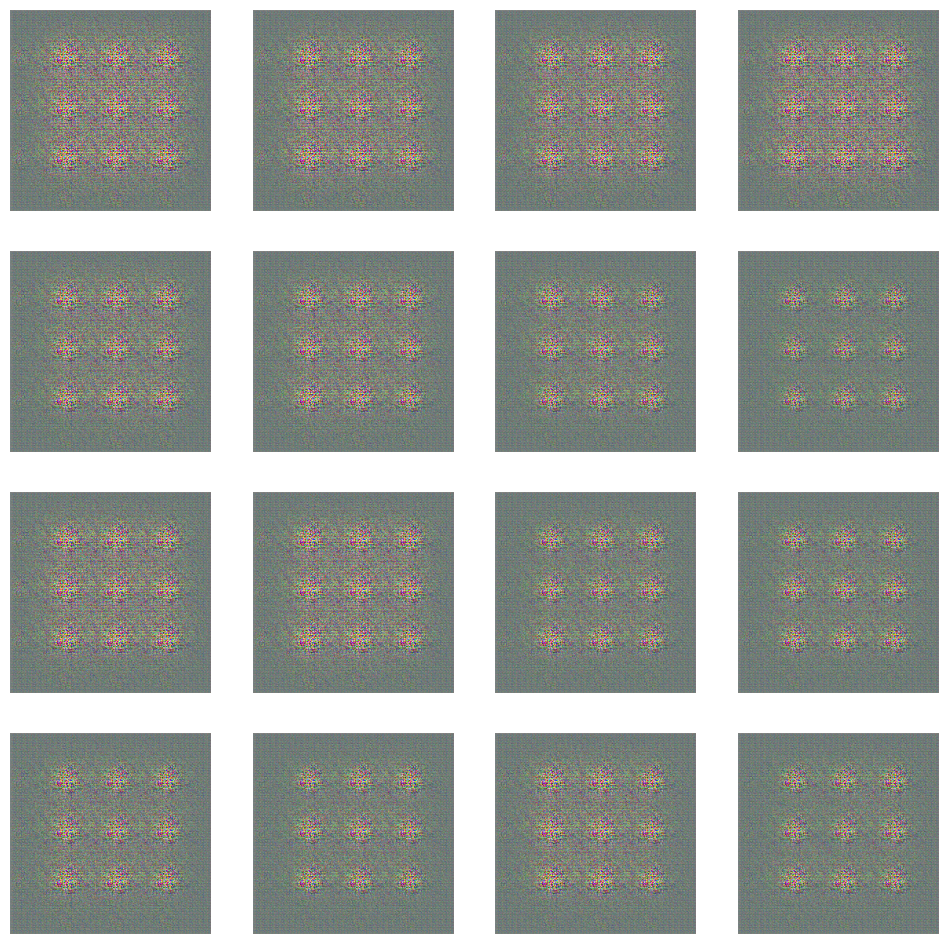

In [18]:
mmgan = GAN(GANGenerator(), GANDiscriminator(), Minimax()).train(real_monet, 150)

Epoch 0: D=0.019530117511749268, G=8.36466121673584
Epoch 1: D=0.6540455222129822, G=3.1465156078338623
Epoch 2: D=0.009040075354278088, G=5.681789398193359
Epoch 3: D=0.16797910630702972, G=2.8752472400665283
Epoch 4: D=0.1818569004535675, G=3.4118263721466064
Epoch 5: D=0.6575820446014404, G=2.634709119796753
Epoch 6: D=0.9826982021331787, G=1.1275858879089355
Epoch 7: D=0.35114040970802307, G=2.1308605670928955
Epoch 8: D=0.5242378115653992, G=2.0336194038391113
Epoch 9: D=0.4013942778110504, G=2.1531763076782227
Epoch 10: D=0.21502266824245453, G=2.5186855792999268
Epoch 11: D=0.7294951677322388, G=0.438517302274704
Epoch 12: D=0.4816267490386963, G=2.525552988052368
Epoch 13: D=0.24611341953277588, G=4.0537495613098145
Epoch 14: D=0.4472801685333252, G=2.2533905506134033
Epoch 15: D=0.9575642943382263, G=1.7597951889038086
Epoch 16: D=0.9140652418136597, G=2.3368003368377686
Epoch 17: D=0.9372256398200989, G=1.8006949424743652
Epoch 18: D=1.4231460094451904, G=1.9017831087112427
E

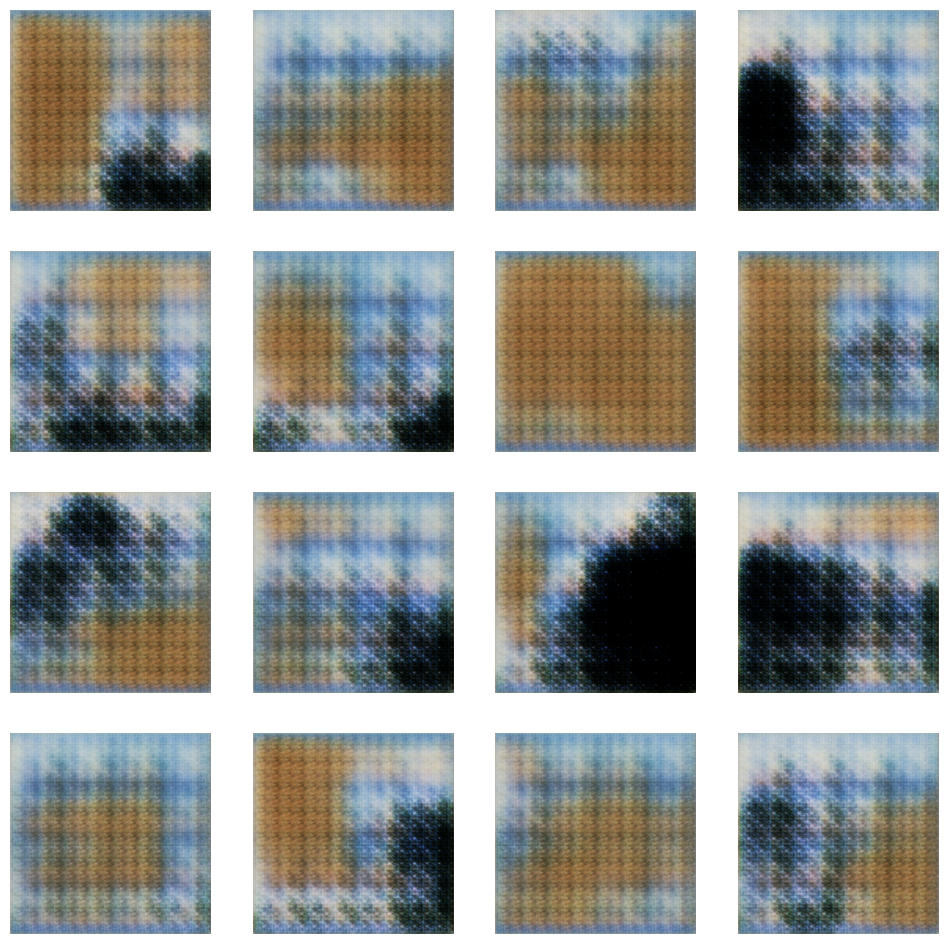

In [19]:
modmmgan = GAN(GANGenerator(), GANDiscriminator(), ModifiedMinimax()).train(real_monet, 150)

Epoch 0: D=0.07618402689695358, G=0.8414059281349182
Epoch 1: D=0.06549085676670074, G=1.0261551141738892
Epoch 2: D=0.0833209976553917, G=0.8902168869972229
Epoch 3: D=0.06925710290670395, G=1.7181892395019531
Epoch 4: D=0.018658913671970367, G=1.1986539363861084
Epoch 5: D=0.031485483050346375, G=0.9223834872245789
Epoch 6: D=0.032053086906671524, G=1.0707281827926636
Epoch 7: D=0.06423677504062653, G=0.8551034331321716
Epoch 8: D=0.09922471642494202, G=0.9943575859069824
Epoch 9: D=0.06714341044425964, G=1.1721158027648926
Epoch 10: D=0.046239644289016724, G=1.5772804021835327
Epoch 11: D=0.04973474144935608, G=1.1135832071304321
Epoch 12: D=0.4981918931007385, G=0.6146978139877319
Epoch 13: D=0.2648303806781769, G=2.8293275833129883
Epoch 14: D=0.052640266716480255, G=1.1917672157287598
Epoch 15: D=0.1540592610836029, G=0.8635126948356628
Epoch 16: D=0.10793565213680267, G=1.4703102111816406
Epoch 17: D=0.10474865883588791, G=0.8987839818000793
Epoch 18: D=0.06727064400911331, G=0.

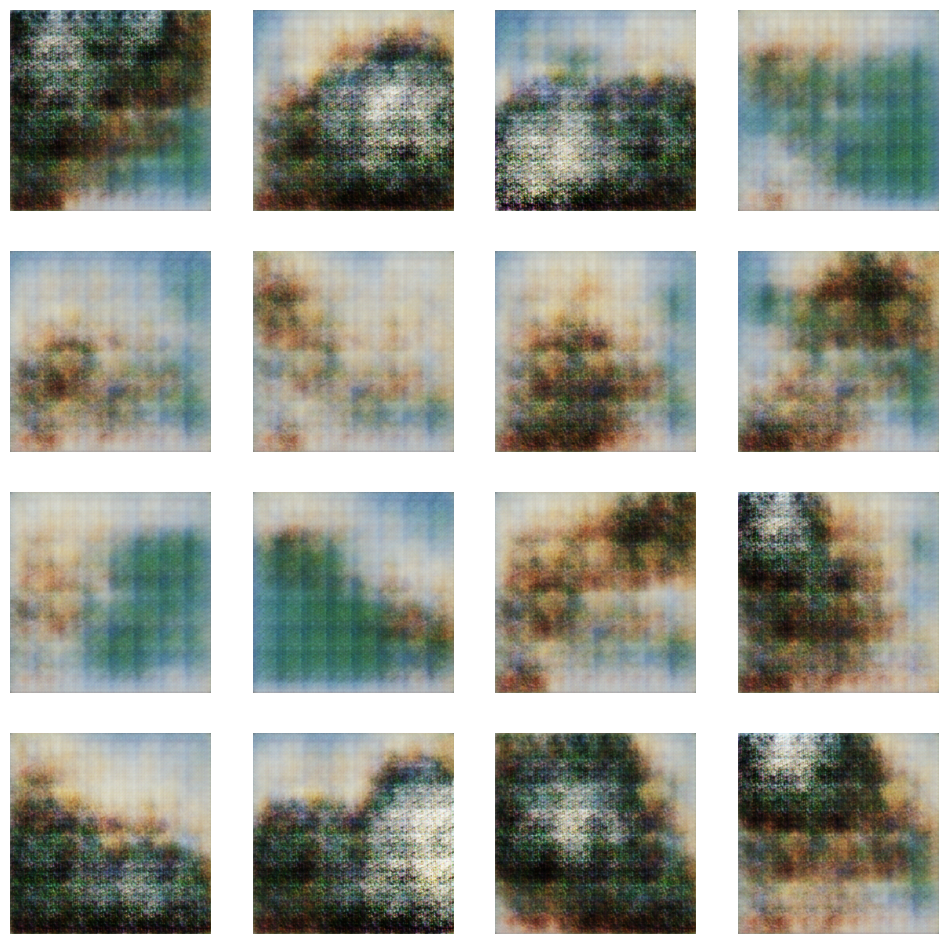

In [20]:
lsgan = GAN(GANGenerator(), GANDiscriminatorLS(), LeastSquare()).train(real_monet, 150)

## Results, Analysis, and Discussion
Our baseline model of DCGAN + Minimax initially performs well but quickly exhibits catastrophic failures after around 10 - 20 training sessions as can be seen above and below. Having observed this model for some time it is apperant that the discriminator has become too powerful and can simply refuse any image that the generator suggests. Because of this there is no opportunity for the generator to train and thus it remains stuck. Manipulating the hyperparameters of the model in order to weaken the discriminator was at times successful, however it quickly became clear that a more robust manipulation method would be required as the discriminator and generator would still fly to various extremes. From this I have clearly learned why loss functions like the Modified Minimax were such significant advancements.

It was with our DCGAN + Modified Minimax that I began seeing success in the models' competition and image output. With this loss function more epochs are a clear benefit and the model no longer got stuck with the discriminator not allowing the generator to train. Managing the hyperparameters of this combination did not consistantly produce better results as it was found maintaining a relatively equal learning rate resulted in the most competition and stability while decreasing or increasing the learning rate of the discriminator from the generator saw less stable results.

It was interesting to note that the DCGAN (Sigmoid) + Least Squared combination would consistantly result in issues similar to the DCGAN + Minimax combination. The discriminator would at times overpower the generator, but it was also possible for the generator to create an image that simply confused the discriminator so much it defaulted to guessing. It was not until the Sigmoid was removed from the end of the discriminator that the Least Squared loss function began to really function.

The DCGAN (No Sigmoid) + Least Squared combination showed about as high quality images as the DCGAN + Modified Minimax with different issues. While the DCGAN Modified Minimax consistantly retains textures after 150 epochs, the DCGAN (No Sigmoid) + Least Squared has less obvious textures and uses more accurate colors but cannot shape the image. I would imagine that with more epochs or training data that DCGANLS would quickly outpace the DCGANMM and this would be an interesting project to persue on future research.

### Troubleshooting
While the Sigmoid issue in DCGAN + Least Squared loss was frustrating, that was more a matter of architecture building than troubleshooting. An example of troubleshooting for this project would instead be adding a tiny value to the loss functions of Minimax and Modified Minimax such that they avoided immediately failing to compete with each other. While this did extend the length of competition for the Minimax from 5 - 10 epochs to 10 - 20, it did not resolve the problem. This did help the Modified Minimax for the rare occasions it would get stuck however.

### Hyperparameter Optimization
I found it was much better to keep learning rate relatively equal between generator and discriminator and that increasing both too much would result in less stable results. The reasons for this are described above.

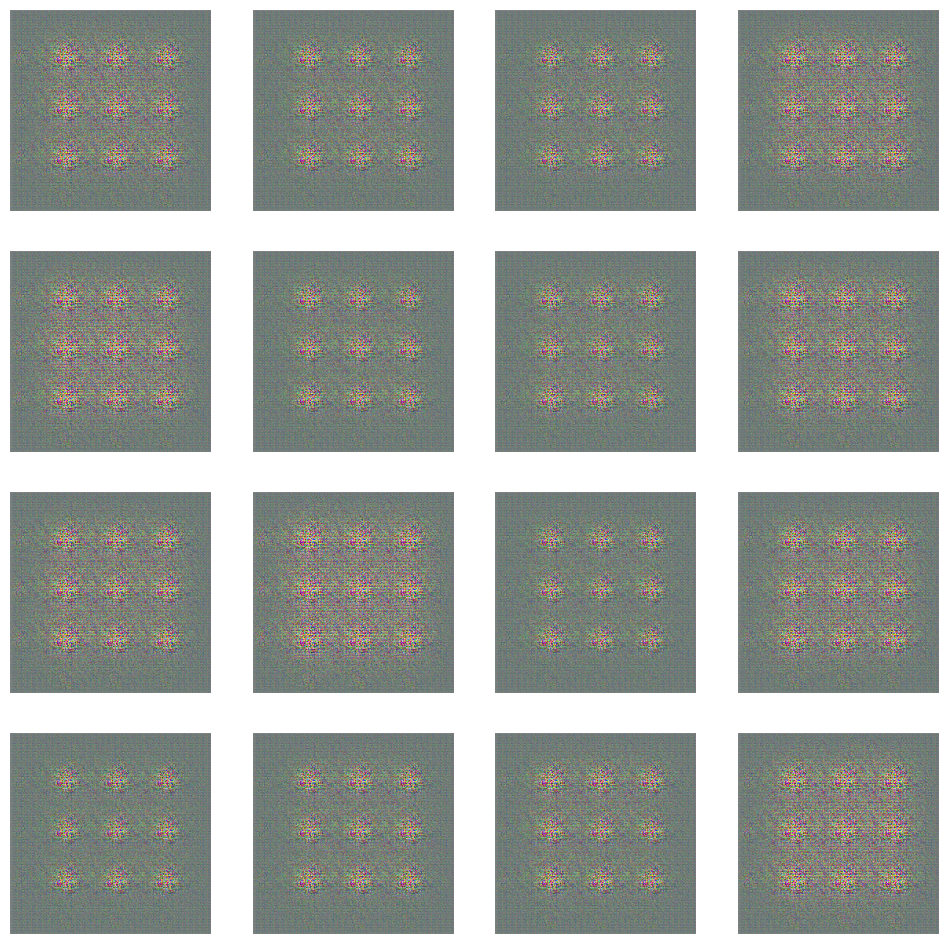

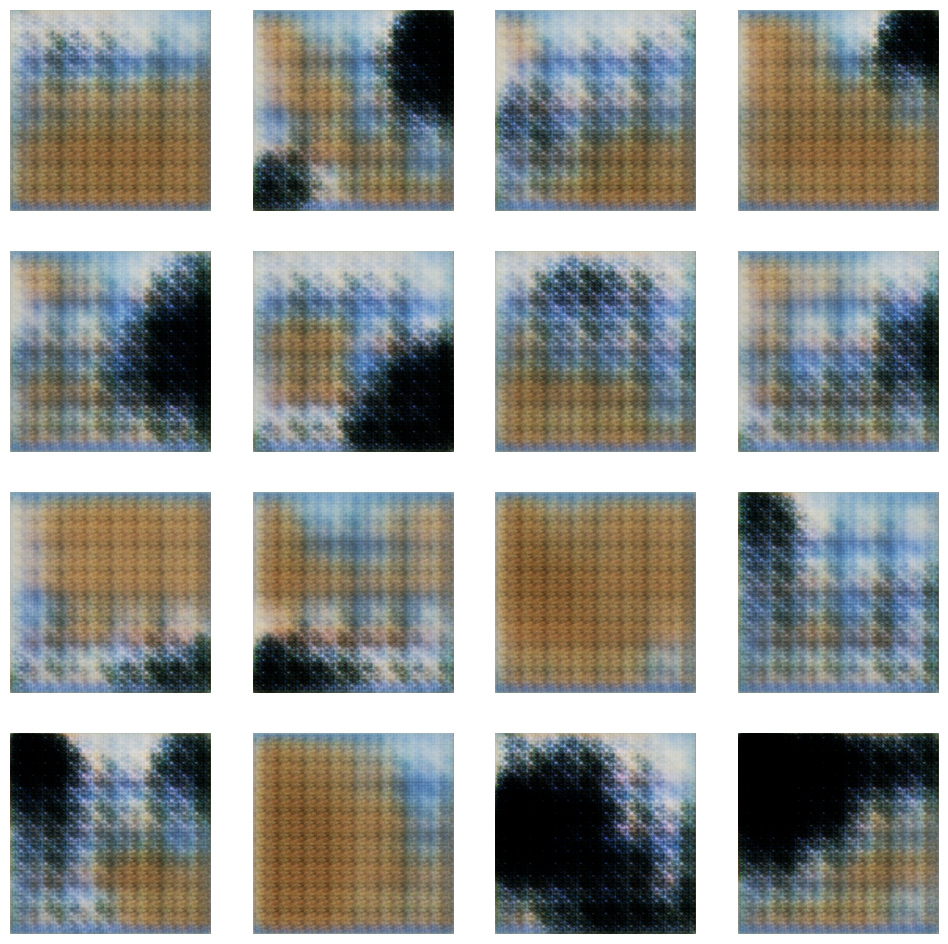

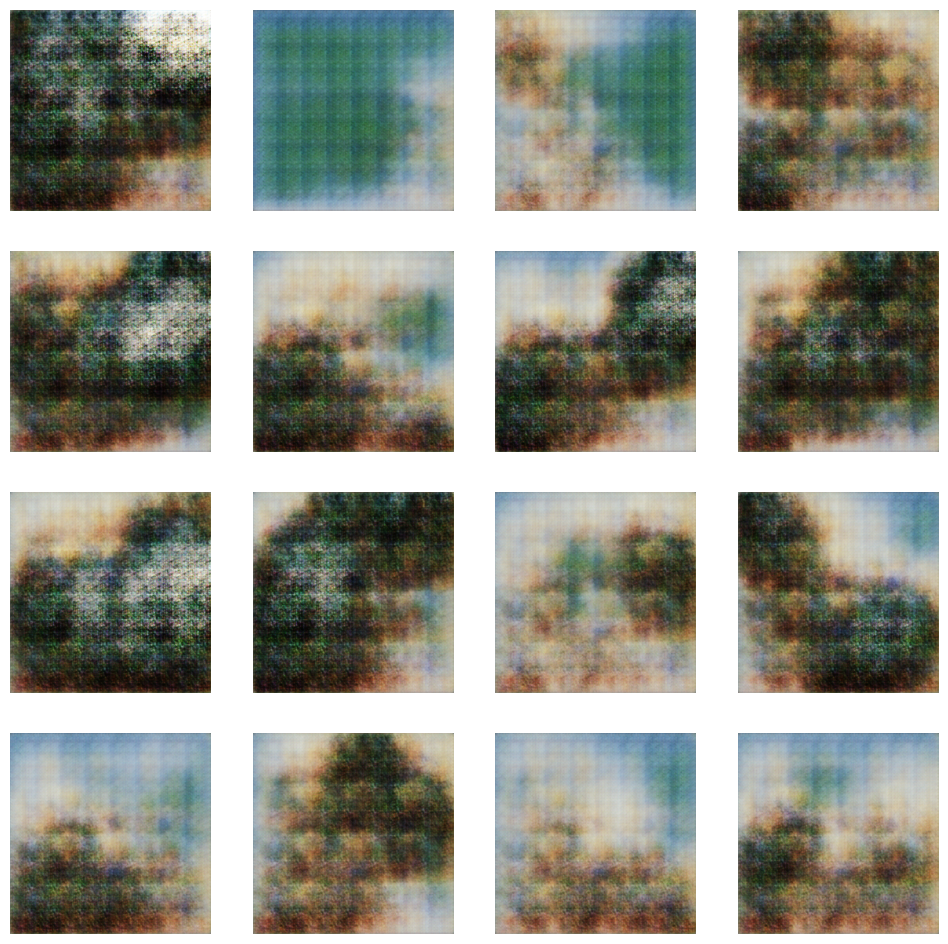

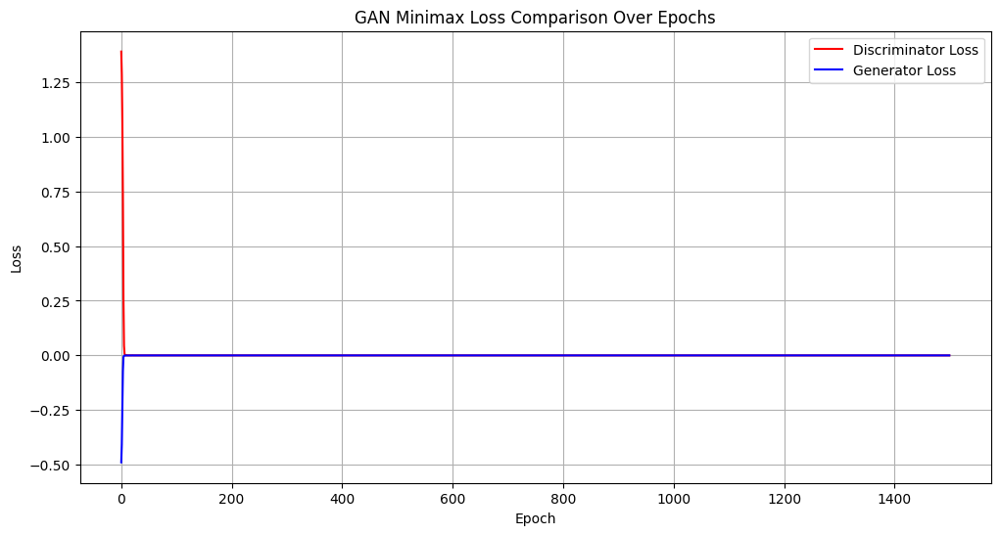

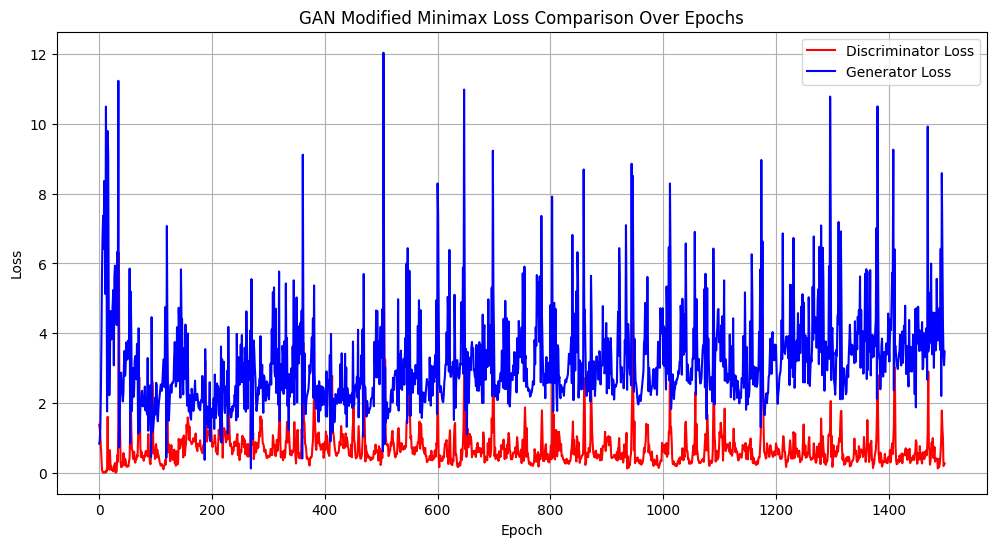

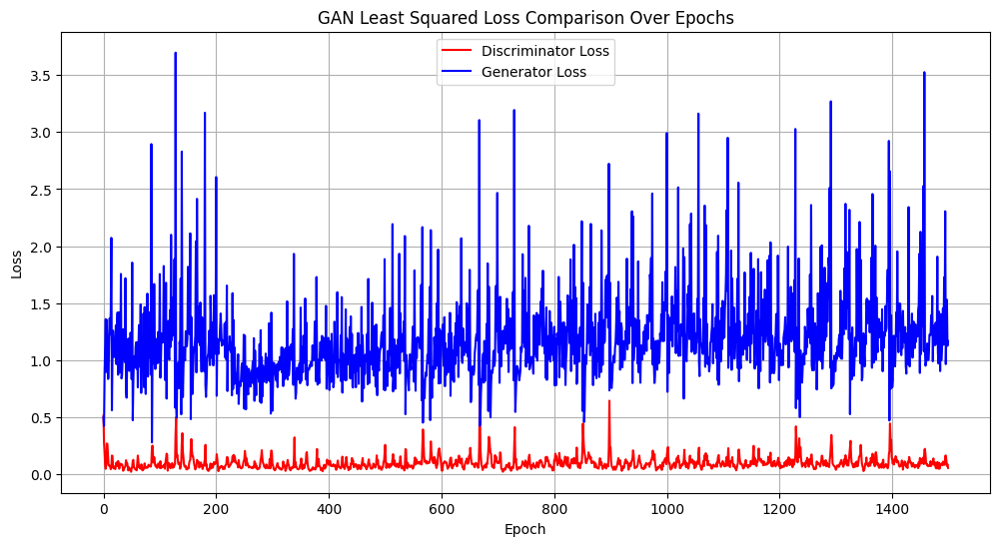

In [21]:
mmgan.generate_and_save_images(20)
modmmgan.generate_and_save_images(20)
lsgan.generate_and_save_images(20)

D_loss = mmgan.d_losses
G_loss = mmgan.g_losses

epochs = range(len(D_loss))

plt.figure(figsize=(12,6))
plt.plot(epochs, D_loss, label='Discriminator Loss', color='red')
plt.plot(epochs, G_loss, label='Generator Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('GAN Minimax Loss Comparison Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

D_loss = modmmgan.d_losses
G_loss = modmmgan.g_losses

epochs = range(len(D_loss))

plt.figure(figsize=(12,6))
plt.plot(epochs, D_loss, label='Discriminator Loss', color='red')
plt.plot(epochs, G_loss, label='Generator Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('GAN Modified Minimax Loss Comparison Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

D_loss = lsgan.d_losses
G_loss = lsgan.g_losses

epochs = range(len(D_loss))

plt.figure(figsize=(12,6))
plt.plot(epochs, D_loss, label='Discriminator Loss', color='red')
plt.plot(epochs, G_loss, label='Generator Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('GAN Least Squared Loss Comparison Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

In [22]:
# def generate_submission_images(generator, num_images=7000, batch_size=200):
#     output_dir = "/kaggle/working/submission2"
#     os.makedirs(output_dir, exist_ok=True)
#     total_generated = 0
    
#     for batch_start in range(0, num_images, batch_size):
#         current_batch = min(batch_size, num_images - batch_start)
        
#         noise = tf.random.normal([current_batch, modmmgan.latent_dim])
#         generated_batch = generator(noise, training=False)
        
#         for i in range(current_batch):
#             img = generated_batch[i]
#             img = (img + 1) * 127.5
#             img = tf.cast(tf.clip_by_value(img, 0, 255), tf.uint8)
            
#             file_num = batch_start + i
#             file_path = os.path.join(output_dir, f"{1 + file_num:05d}.jpg")
#             tf.keras.utils.save_img(file_path, img, quality=95)
        
#         total_generated += current_batch
        
#         if total_generated % 1000 == 0:
#             remaining = (num_images - total_generated)
#             print(f"  Generated {total_generated}/{num_images} ")
#     print(f"Generated {total_generated} images")
#     return output_dir

# images_dir = generate_submission_images(
#     generator=modmmgan.generator,
#     num_images=7100,
#     batch_size=200
# )

# zip_path = "/kaggle/working/images.zip"

# with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
#     jpg_files = sorted([f for f in os.listdir(images_dir) if f.endswith('.jpg')])
    
#     for jpg_file in jpg_files:
#         file_path = os.path.join(images_dir, jpg_file)
#         zipf.write(file_path, jpg_file)
# zip_size = os.path.getsize(zip_path) / (1024 * 1024)
# file_count = len(jpg_files)